In [1]:
#**************************************************************************************
#
#    Title: <YoanoGAN-Experiment>
#    Author: <Ege Demir>
#    Date: <6/26/1011>
#    Code version: <1.0>
#
#**************************************************************************************


In [2]:
import glob
import pandas as pd
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
import tensorflow as tf
from IPython import display
from IPython.display import clear_output
from keras.initializers import RandomNormal
from PIL import Image
from datetime import datetime
import math
import matplotlib
import io

matplotlib.use('Agg')


# Load and prepare dataset

In [47]:
BUFFER_SIZE = 60000
BATCH_SIZE = 128
CLASS_AMT = 10
LATENT_DIM = 20

In [48]:
pi = math.pi

def PointsInCircum(r,n=100):
    return [(math.cos(2*pi/n*x)*r,math.sin(2*pi/n*x)*r) for x in range(0,n+1)]

In [49]:
def generate_dataset_around_mean(singleClassSize,classAmt,circleRadius=5):

  class_means = np.array(PointsInCircum(r=circleRadius,n=classAmt))

  x = np.random.multivariate_normal(class_means[0], np.eye(2), size=singleClassSize)
  for i,mean in enumerate(class_means[1:-1,:]):
    x = np.append(x,np.random.multivariate_normal(mean, np.eye(2), size=singleClassSize),axis=0)

  y = np.zeros(singleClassSize)
  for i in range(classAmt-1):
    y = np.append(y,np.ones(singleClassSize)*(i+1),axis=0)

    
  return x,y,class_means


In [50]:
x,y,class_means = generate_dataset_around_mean(singleClassSize=1000,classAmt=CLASS_AMT,circleRadius=15)

In [51]:
y = tf.keras.utils.to_categorical(y, CLASS_AMT)

In [52]:
# Batch and shuffle the data
dataset = tf.data.Dataset.from_tensor_slices((x,y)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Custom Layers

# Custom Models

## Generator

In [75]:
def make_generator_model(latent_dim,class_Amt):
    model = tf.keras.Sequential()
    model.add(layers.Dense(16,input_shape=(latent_dim+class_Amt,)))
    
    for i in range(10):
      model.add(layers.Dense(64))
      model.add(layers.LeakyReLU(0.1))

    
    model.add(layers.Dense(2,activation='sigmoid'))
    assert model.output_shape == (None,2)

    return model

## Discriminator

In [76]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Dense(64))
    
    for i in range(10):
      model.add(layers.Dense(32))
      model.add(layers.LeakyReLU(0.1))


    model.add(layers.Dense(CLASS_AMT))

    return model

# Define Loss and Optimizers

In [77]:
# This method returns a helper function to compute cross entropy loss
cross_entropy_categorical = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
cross_entropy_binary = tf.keras.losses.BinaryCrossentropy(from_logits=True)


In [78]:
def discriminator_loss(y_pred,y_real):
    return cross_entropy_categorical(y_real,y_pred)

In [79]:
def generator_loss(y_pred,y_real):


    # indices = tf.math.argmax(y_real,axis=1)

    # arr = []
    # for i in range(BATCH_SIZE):
    #   arr.append(y_pred[i,indices[i]])

    # final_cross_entropy = cross_entropy_binary(tf.zeros_like(indices),arr)

    final_cross_entropy = cross_entropy_categorical((tf.ones_like(y_real)-(y_real)),y_pred)
    
    return final_cross_entropy






# Define Callbacks

In [80]:
logdir = "logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
file_writer = tf.summary.create_file_writer(logdir + "/metrics")
file_writer.set_as_default()


# Define training loop

In [81]:
#EPOCHS = 500
#noise_dim = 128
#num_examples_to_generate = 9

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)

#rand_y = [0,1,2,3,4,5,6,7,8]
#and_y = tf.keras.utils.to_categorical(rand_y, 10)

#seed = np.append(rand_y,tf.random.normal([num_examples_to_generate, noise_dim]),axis=1)

In [82]:
class YoanoGAN(tf.keras.Model):
    def __init__(self, discriminator, generator, latent_dim,classAmt,lmbd=0.7):
        super(YoanoGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        
        self.currentBatch = 0

        #FIX SEED INPUT FOR VISUALIZATION
        rand_y = []
        self.fix_point_seed = np.empty(shape=(0,2))
        for currentClass in range(classAmt):
          rand_y = np.append(rand_y,np.ones(1000)*currentClass)
          self.fix_point_seed = np.append(self.fix_point_seed,np.random.multivariate_normal(class_means[currentClass], np.eye(2), size=1000),axis=0)
        
        rand_y = tf.keras.utils.to_categorical(rand_y, classAmt)
        self.seed = np.append(rand_y,tf.random.normal([classAmt*1000, latent_dim]),axis=1)
        #--------------------------------

        
      
        self.latent_dim = latent_dim
        self.lmbd = lmbd
        self.classAmt = classAmt
        
        self.gen_loss_tracker = tf.keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = tf.keras.metrics.Mean(name="discriminator_loss")
        self.norm_tracker = tf.keras.metrics.Mean(name="gen_output_norm")
        self.w_noise_accuracy_tracker = tf.keras.metrics.Mean(name="w_noise_accuracy")
        self.wo_noise_accuracy_tracker = tf.keras.metrics.Mean(name="wo_noise_accuracy")
        
        
    @property
    def metrics(self):
        return [self.gen_loss_tracker, self.disc_loss_tracker,self.norm_tracker,self.w_noise_accuracy_tracker,self.wo_noise_accuracy_tracker]
    
    def plot_visual_metrics(self):

      generated_noise = self.generator(self.seed)*self.lmbd
      new_means = []

      fig = plt.figure(figsize =(7,7))
      for curClass in range(self.classAmt):
        
        noisy_points = np.array(generated_noise[curClass*1000:(curClass+1)*1000]+self.fix_point_seed[curClass*1000:(curClass+1)*1000])
        plt.scatter(noisy_points.T[0],noisy_points.T[1])

        #UNCOMMENT BELOW IF PLOTTING MEANS
        #New_class_mean = np.mean(generated_noise[curClass*1000:(curClass+1)*1000]+self.fix_point_seed[curClass*1000:(curClass+1)*1000],axis=0)
        #plt.scatter(New_class_mean.T[0],New_class_mean.T[1])#CHANGE COLOR
      
      plt.scatter(class_means.T[0],class_means.T[1])


      buf = io.BytesIO()
      plt.savefig(buf, format='png')
      buf.seek(0)
      image = tf.image.decode_png(buf.getvalue(), channels=4)
      image = tf.expand_dims(image, 0)
      tf.summary.image("Generator Output Images", image, step=self.currentBatch)
      plt.close(fig)


    
    def get_accuracy(self,x,y_real):
        x = tf.cast(x,tf.int64)
        y_real = tf.cast(y_real,tf.int64)
        
        predictions = tf.math.argmax(self.discriminator(x),output_type=tf.dtypes.int64,axis=1)
        return (tf.math.count_nonzero(tf.math.argmax(y_real,axis=1)-predictions))/(tf.cast(tf.shape(x)[0],tf.int64))
    
    def get_norm(self,noise):
        norm_calculated = tf.norm(noise,ord=2,axis=1)
        norm_mean = tf.math.reduce_mean(norm_calculated)
        return norm_mean
    
    def compile(self, d_optimizer, g_optimizer, dis_loss_fn, gen_loss_fn):
        super(YoanoGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.dis_loss_fn = dis_loss_fn
        self.gen_loss_fn = gen_loss_fn

    def train_step(self, data):
        
        self.currentBatch = self.currentBatch + 1
        
        #Import data and infer batch size
        x, y = data
        BATCH_SIZE = tf.shape(x)[0]
        
        #Cast x to float32 to match with generator output type (Otherwise adding the two gives an error)
        x = tf.cast(x, tf.float32)
        
        #Append normal noise and one hot labeled y data together for generator input.
        gen_in = tf.experimental.numpy.append(y, tf.random.normal([BATCH_SIZE, self.latent_dim]), axis=1)
        
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

            #Run the generator and generate noises
            generated_noise = self.generator(gen_in, training=True)
            generated_noise = tf.squeeze(generated_noise)*self.lmbd #Squeezing to remove axis-1 with 1 dimension.
            
            #Check discriminator output by adding noise and x of dataset.
            disc_output = self.discriminator(generated_noise+x, training=True)
            
            #Calculate loss values for both models.
            gen_loss = self.gen_loss_fn(disc_output,y)
            disc_loss = self.dis_loss_fn(disc_output,y)
            
        
        #Calculate and apply gradients for both models.
        if(True):
            gradients_of_generator = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
            self.g_optimizer.apply_gradients(zip(gradients_of_generator, self.generator.trainable_variables))
    
        if(True):
            gradients_of_discriminator = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
            self.d_optimizer.apply_gradients(zip(gradients_of_discriminator, self.discriminator.trainable_variables))
        
        
        if(self.currentBatch % 10 == 0):
          self.plot_visual_metrics()

        wo_noise_acc = self.get_accuracy(x,y)
        w_noise_acc = self.get_accuracy(generated_noise+x,y)
        norm = self.get_norm(generated_noise)
        
        tf.summary.scalar('Generator Loss', data=gen_loss, step=self.currentBatch)
        tf.summary.scalar('Discriminator Loss', data=disc_loss, step=self.currentBatch)
        tf.summary.scalar('Generator Norm', data=norm, step=self.currentBatch)
        tf.summary.scalar('With Noise Accuracy', data=w_noise_acc, step=self.currentBatch)
        tf.summary.scalar('Without Noise Accuracy', data=wo_noise_acc, step=self.currentBatch)
        
        
        
        #Update and return metrics
        self.gen_loss_tracker.update_state(gen_loss)
        self.disc_loss_tracker.update_state(disc_loss)
        self.norm_tracker.update_state(norm)
        self.w_noise_accuracy_tracker.update_state(w_noise_acc)
        self.wo_noise_accuracy_tracker.update_state(wo_noise_acc)
        return {
            "g_loss": self.gen_loss_tracker.result(),
            "d_loss": self.disc_loss_tracker.result(),
            "norm": self.norm_tracker.result(),
            "With Noise Accuracy": self.w_noise_accuracy_tracker.result(),
            "Without Noise Accuracy": self.wo_noise_accuracy_tracker.result()
        }



In [83]:
generator = make_generator_model(latent_dim=LATENT_DIM,class_Amt=CLASS_AMT)
discriminator = make_discriminator_model()

yoano_gan = YoanoGAN(
    discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM,classAmt=CLASS_AMT,lmbd=25)

yoano_gan.compile(
    d_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003),
    g_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003),
    dis_loss_fn = discriminator_loss,
    gen_loss_fn = generator_loss
)




In [84]:
tf.config.run_functions_eagerly(True) #Figure out how to do graph execution

In [85]:
yoano_gan.fit(dataset,batch_size=64, epochs=500)

Epoch 1/500
79/79 [==============================] - 11s 131ms/step - g_loss: 21.2387 - d_loss: 2.1578 - norm: 13.2350 - With Noise Accuracy: 0.7116 - Without Noise Accuracy: 0.7896
Epoch 2/500
79/79 [==============================] - 11s 131ms/step - g_loss: 50.8927 - d_loss: 0.7221 - norm: 8.3587e-04 - With Noise Accuracy: 0.1781 - Without Noise Accuracy: 0.1781
Epoch 3/500
79/79 [==============================] - 11s 135ms/step - g_loss: 136.8022 - d_loss: 0.0127 - norm: 1.0828e-04 - With Noise Accuracy: 4.5584e-04 - Without Noise Accuracy: 4.5584e-04
Epoch 4/500
79/79 [==============================] - 11s 137ms/step - g_loss: 165.9584 - d_loss: 0.0027 - norm: 4.1843e-05 - With Noise Accuracy: 0.0000e+00 - Without Noise Accuracy: 0.0000e+00
Epoch 5/500
79/79 [==============================] - 11s 136ms/step - g_loss: 179.2029 - d_loss: 0.0013 - norm: 1.7825e-05 - With Noise Accuracy: 0.0000e+00 - Without Noise Accuracy: 0.0000e+00
Epoch 6/500
79/79 [==============================] 

KeyboardInterrupt: ignored

In [64]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

In [65]:
%tensorboard --samples_per_plugin=images=100 --logdir logs/scalars

<IPython.core.display.Javascript object>

In [ ]:
dEPOCHS = 500
latent_dim = 20
num_examples_to_generate = 9

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)

rand_y = [0,1,2,3,4,5,6,7,8]
rand_y = tf.keras.utils.to_categorical(rand_y, 10)

seed = np.append(rand_y,tf.random.normal([num_examples_to_generate, latent_dim]),axis=1)


NameError: name 'tf' is not defined

In [ ]:
def plot_gen_output(single_class_sample_size,class_Amount):
  gen_in = tf.experimental.numpy.append(y, tf.random.normal([single_class_sample_size*class_Amount, 20]), axis=1)
  generated_noise = yoano_gan.generator(gen_in)

  noisy_x = x+generated_noise

  print("Noise 0 Means:" + str(np.mean(generated_noise[0:1000,:],axis=0)))
  print("Noise 1 Means:" + str(np.mean(generated_noise[1000:2000,:],axis=0)))

  print("------------------------------------------")
  print("Class 0 Means:" + str(np.mean(x[0:1000,:],axis=0)))
  print("Class 1 Means:" + str(np.mean(x[1000:2000,:],axis=0)))

  print("------------------------------------------")
  print("Noisy Class 0 Means:" + str(np.mean(noisy_x[0:1000,:],axis=0)))
  print("Noisy Class 1 Means:" + str(np.mean(noisy_x[1000:2000,:],axis=0)))

  plt.scatter(np.mean(x[0:1000,0],axis=0),np.mean(x[0:1000,1],axis=0),label="Class 0")
  plt.scatter(np.mean(x[1000:2000,0],axis=0),np.mean(x[1000:2000,1],axis=0),label="Class 1")

  plt.scatter(np.mean(noisy_x[0:1000,0],axis=0),np.mean(noisy_x[0:1000,1],axis=0),label="Noisy Class 0")
  plt.scatter(np.mean(noisy_x[1000:2000,0],axis=0),np.mean(noisy_x[1000:2000,1],axis=0),label="Noisy Class 1")

  plt.legend()

Noise 0 Means:[-3.763762  -5.1426215]
Noise 1 Means:[-1.718383 -3.110839]
------------------------------------------
Class 0 Means:[1.05066639 0.97114218]
Class 1 Means:[-1.00026896 -0.96587131]
------------------------------------------
Noisy Class 0 Means:[-2.7130966 -4.171476 ]
Noisy Class 1 Means:[-2.7186513 -4.076709 ]


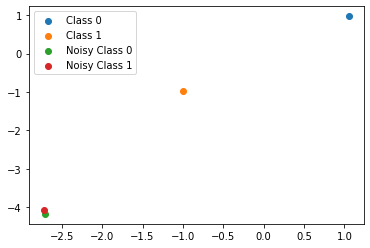

In [73]:
def test_model_w_attacker():
  #Prepare y values and random values for input to generator
  rand_y_in = tf.experimental.numpy.append(y, tf.random.normal([x.shape[0], LATENT_DIM]), axis=1)
  
  #Generate noises for rand_y_in
  generated_noise = yoano_gan.generator(rand_y_in)
  generated_noise = generated_noise * 25
  generated_noise = tf.squeeze(generated_noise)

  #Add noises to x images
  noisy_images = generated_noise.numpy()+x

  #Create a new attacker model that has the same architecture as GAN discriminator, and try to fit to noisy x inputs
  attacker_model = make_discriminator_model()
  attacker_model.compile(optimizer=tf.keras.optimizers.Adam(),loss=cross_entropy_categorical,metrics=["accuracy"])
  return attacker_model.fit(noisy_images,y,validation_split=0.3,epochs=2)

In [74]:
test_model_w_attacker()

Epoch 1/2


/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


219/219 [==============================] - 17s 72ms/step - loss: 0.7076 - accuracy: 0.6710 - val_loss: 11.6630 - val_accuracy: 0.0000e+00
Epoch 2/2
219/219 [==============================] - 10s 48ms/step - loss: 0.4401 - accuracy: 0.7603 - val_loss: 9.3541 - val_accuracy: 0.0000e+00


In [ ]:
x = np.empty(shape=(0,3*1000))
for curClass in range(3):
  x = np.append(x,tf.keras.utils.to_categorical(np.ones(3)*1000, 3),axis=0)

print(x.shape)

IndexError: ignored

array([[0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)

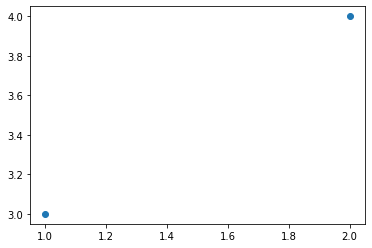

In [ ]:
plt.scatter([1,2],[3,4])